Logistic regression : binary


In [1]:
import pandas as pd

C:\Users\Dell\AppData\Local\Temp\ipykernel_105492\4080736814.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
df=pd.read_csv('Heart.csv')
df

,Unnamed: 0,Age,Sex,ChestPain,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca,Thal,AHD
0,1,63,1,typical,145,233,1,2,150,0,2.3,3,0.0,fixed,No
1,2,67,1,asymptomatic,160,286,0,2,108,1,1.5,2,3.0,normal,Yes
2,3,67,1,asymptomatic,120,229,0,2,129,1,2.6,2,2.0,reversable,Yes
3,4,37,1,nonanginal,130,250,0,0,187,0,3.5,3,0.0,normal,No
4,5,41,0,nontypical,130,204,0,2,172,0,1.4,1,0.0,normal,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,299,45,1,typical,110,264,0,0,132,0,1.2,2,0.0,reversable,Yes
299,300,68,1,asymptomatic,144,193,1,0,141,0,3.4,2,2.0,reversable,Yes
300,301,57,1,asymptomatic,130,131,0,0,115,1,1.2,2,1.0,reversable,Yes
301,302,57,0,nontypical,130,236,0,2,174,0,0.0,2,1.0,normal,Yes


In [3]:
df=df.drop(columns='Unnamed: 0')
df

,Age,Sex,ChestPain,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca,Thal,AHD
0,63,1,typical,145,233,1,2,150,0,2.3,3,0.0,fixed,No
1,67,1,asymptomatic,160,286,0,2,108,1,1.5,2,3.0,normal,Yes
2,67,1,asymptomatic,120,229,0,2,129,1,2.6,2,2.0,reversable,Yes
3,37,1,nonanginal,130,250,0,0,187,0,3.5,3,0.0,normal,No
4,41,0,nontypical,130,204,0,2,172,0,1.4,1,0.0,normal,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,45,1,typical,110,264,0,0,132,0,1.2,2,0.0,reversable,Yes
299,68,1,asymptomatic,144,193,1,0,141,0,3.4,2,2.0,reversable,Yes
300,57,1,asymptomatic,130,131,0,0,115,1,1.2,2,1.0,reversable,Yes
301,57,0,nontypical,130,236,0,2,174,0,0.0,2,1.0,normal,Yes


In [4]:
df['ChestPain']=df['ChestPain'].astype('category')
df['ChestPain']=df['ChestPain'].cat.codes
df['Thal']=df['Thal'].astype('category')
df['Thal']=df['Thal'].cat.codes
df['AHD']=df['AHD'].astype('category')
df['AHD']=df['AHD'].cat.codes
df

,Age,Sex,ChestPain,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca,Thal,AHD
0,63,1,3,145,233,1,2,150,0,2.3,3,0.0,0,0
1,67,1,0,160,286,0,2,108,1,1.5,2,3.0,1,1
2,67,1,0,120,229,0,2,129,1,2.6,2,2.0,2,1
3,37,1,1,130,250,0,0,187,0,3.5,3,0.0,1,0
4,41,0,2,130,204,0,2,172,0,1.4,1,0.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,45,1,3,110,264,0,0,132,0,1.2,2,0.0,2,1
299,68,1,0,144,193,1,0,141,0,3.4,2,2.0,2,1
300,57,1,0,130,131,0,0,115,1,1.2,2,1.0,2,1
301,57,0,2,130,236,0,2,174,0,0.0,2,1.0,1,1


In [5]:
#null values??
df.isnull().sum()

Age          0
Sex          0
ChestPain    0
RestBP       0
Chol         0
Fbs          0
RestECG      0
MaxHR        0
ExAng        0
Oldpeak      0
Slope        0
Ca           4
Thal         0
AHD          0
dtype: int64

In [6]:
#removing null values:
df=df.dropna()

In [7]:
#separate x and y
x=df.drop(columns='AHD')
x

,Age,Sex,ChestPain,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca,Thal
0,63,1,3,145,233,1,2,150,0,2.3,3,0.0,0
1,67,1,0,160,286,0,2,108,1,1.5,2,3.0,1
2,67,1,0,120,229,0,2,129,1,2.6,2,2.0,2
3,37,1,1,130,250,0,0,187,0,3.5,3,0.0,1
4,41,0,2,130,204,0,2,172,0,1.4,1,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
297,57,0,0,140,241,0,0,123,1,0.2,2,0.0,2
298,45,1,3,110,264,0,0,132,0,1.2,2,0.0,2
299,68,1,0,144,193,1,0,141,0,3.4,2,2.0,2
300,57,1,0,130,131,0,0,115,1,1.2,2,1.0,2


In [8]:
#putting dropped x value in y:
y=df['AHD']


In [9]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=21)

In [10]:
x_train

,Age,Sex,ChestPain,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca,Thal
290,67,1,1,152,212,0,2,150,0,0.8,2,0.0,2
264,61,1,0,138,166,0,2,125,1,3.6,2,1.0,1
197,45,0,0,138,236,0,2,152,1,0.2,2,0.0,1
77,51,0,1,140,308,0,2,142,0,1.5,1,1.0,1
15,57,1,1,150,168,0,0,174,0,1.6,1,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
189,69,1,1,140,254,0,2,146,0,2.0,2,3.0,2
120,48,1,0,130,256,1,2,150,1,0.0,1,2.0,2
48,65,0,1,140,417,1,2,157,0,0.8,1,1.0,1
262,60,0,3,150,240,0,0,171,0,0.9,1,0.0,1


In [11]:
x_test

,Age,Sex,ChestPain,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca,Thal
61,46,0,1,142,177,0,2,160,1,1.4,3,0.0,1
300,57,1,0,130,131,0,0,115,1,1.2,2,1.0,2
55,54,1,0,124,266,0,2,109,1,2.2,2,1.0,2
245,67,1,0,120,237,0,0,71,0,1.0,2,0.0,1
95,52,1,0,128,255,0,0,161,1,0.0,1,1.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,41,1,2,135,203,0,0,132,0,0.0,2,0.0,0
117,35,0,0,138,183,0,0,182,0,1.4,1,0.0,1
211,38,1,3,120,231,0,0,182,1,3.8,2,0.0,2
233,74,0,2,120,269,0,2,121,1,0.2,1,1.0,1


In [12]:
y_train


290    1
264    1
197    0
77     0
15     0
      ..
189    1
120    1
48     0
262    0
209    1
Name: AHD, Length: 209, dtype: int8

In [13]:
#scaling the data:-
from sklearn.preprocessing import StandardScaler ,OneHotEncoder
scaler=StandardScaler()
x_train_scaled=scaler.fit_transform(x_train)
x_test_scaled=scaler.transform(x_test)
x_test_scaled

array([[-0.96343013, -1.48841682,  0.21213203, ...,  2.42833312,
        -0.70203785, -0.49996949],
       [ 0.26708424,  0.67185481, -0.84347737, ...,  0.70792084,
         0.36119339,  1.13274336],
       [-0.06851059,  0.67185481, -0.84347737, ...,  0.70792084,
         0.36119339,  1.13274336],
       ...,
       [-1.85834967,  0.67185481,  2.32335085, ...,  0.70792084,
        -0.70203785,  1.13274336],
       [ 2.16878827, -1.48841682,  1.26774144, ..., -1.01249144,
         0.36119339, -0.49996949],
       [ 1.05013884, -1.48841682, -0.84347737, ...,  0.70792084,
         1.42442462, -0.49996949]])

In [14]:
from sklearn.linear_model import LinearRegression
logreg=LinearRegression().fit(x_train_scaled,y_train)

In [15]:
logreg.predict(x_train)

c:\ANACONDA\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but LinearRegression was fitted without feature names
  warnings.warn(


array([-0.91211282,  0.28399793, -1.55829303, -0.75502497, -2.61863285,
       -1.54130328, -3.36164606, -1.96364192, -3.30215938, -0.61526082,
       -4.43897504,  0.16111292, -2.0478546 , -3.05672736, -2.66233957,
       -2.99069771, -0.55255103, -2.93246477, -3.45168841, -3.45539681,
       -0.88447266, -1.51439889, -2.3871808 , -1.61253499,  1.50905841,
        0.62436305, -3.92552843, -0.27206352, -1.72450302, -3.24981943,
        0.65954555,  1.21579451, -2.95481091, -0.50861574, -3.79577002,
       -3.27233885, -0.61900449, -2.82499145, -1.21256673,  1.63654403,
       -3.90474707, -3.30987809,  1.60288657, -3.05934037, -2.41813278,
        3.53288989, -1.17463179, -3.02605772,  1.28994332, -4.71552646,
        0.41667094, -1.28101222, -0.62150881, -2.58517205, -1.34527254,
       -2.54310515, -3.83263901,  1.14984634, -0.73553891,  1.37942674,
        2.02407698, -0.48576442, -1.56547009, -2.39773913, -3.1585082 ,
       -2.55344819, -4.24603332, -1.64594014, -1.55145228, -1.48

In [16]:
logreg.score(x_train_scaled,y_train)

0.5113503668793775

In [17]:
logreg.score(x_test_scaled,y_test)

0.505317642955534

In [18]:
reg1=LinearRegression(
                      fit_intercept=True,
                      ).fit(x_train_scaled,y_train)

In [19]:
reg1.score(x_train_scaled,y_train)

0.5113503668793775

Multiclass Classification Problem:

In [20]:
import pandas as pd

In [21]:
train=pd.read_csv('fashion-mnist_train.csv')
train

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,6,0,0,0,0,0,0,0,5,0,...,0,0,0,30,43,0,0,0,0,0
3,0,0,0,0,1,2,0,0,0,0,...,3,0,0,0,0,1,0,0,0,0
4,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59996,1,0,0,0,0,0,0,0,0,0,...,73,0,0,0,0,0,0,0,0,0
59997,8,0,0,0,0,0,0,0,0,0,...,160,162,163,135,94,0,0,0,0,0
59998,8,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [22]:
test=pd.read_csv('fashion-mnist_test.csv')
test

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0,0,0,0,0,0,0,0,9,8,...,103,87,56,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,34,0,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,14,53,99,...,0,0,0,0,63,53,31,0,0,0
3,2,0,0,0,0,0,0,0,0,0,...,137,126,140,0,133,224,222,56,0,0
4,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0,0,0,0,0,0,0,0,0,0,...,32,23,14,20,0,0,1,0,0,0
9996,6,0,0,0,0,0,0,0,0,0,...,0,0,0,2,52,23,28,0,0,0
9997,8,0,0,0,0,0,0,0,0,0,...,175,172,172,182,199,222,42,0,1,0
9998,8,0,1,3,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [23]:
#splittingthe data:
X_train=train.drop(columns='label')
y_train=train['label']

X_test=test.drop(columns='label')
y_test=test['label']

In [24]:
X_train

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,5,0,0,...,0,0,0,30,43,0,0,0,0,0
3,0,0,0,1,2,0,0,0,0,0,...,3,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59996,0,0,0,0,0,0,0,0,0,0,...,73,0,0,0,0,0,0,0,0,0
59997,0,0,0,0,0,0,0,0,0,0,...,160,162,163,135,94,0,0,0,0,0
59998,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [25]:
X_train_list=X_train.values.tolist()
X_train_list

[[0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  4,
  0,
  0,
  0,
  0,
  0,
  62,
  61,
  21,
  29,
  23,
  51,
  136,
  61,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  88,
  201,
  228,
  225,
  255,
  115,
  62,
  137,
  255,
  235,
  222,
  255,
  135,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  47,
  252,
  234,
  238,
  224,
  215,
  215,
  229,
  108,
  180,
  207,
  214,
  224,
  231,
  249,
  254,
  45,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  214,
  222,
  210,
  213,
  224,
  225,
  217,
  220,
  254,
  233,


In [26]:
import numpy as np
import matplotlib.pyplot as plt


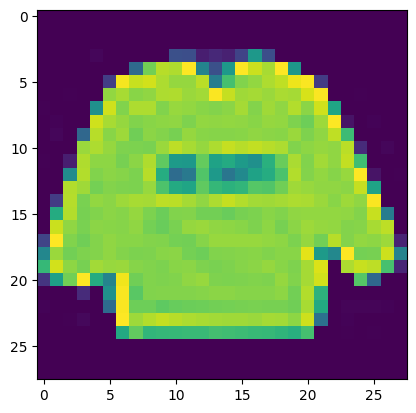

In [27]:
plt.imshow(np.reshape(X_train_list[0],(28,28,1)))

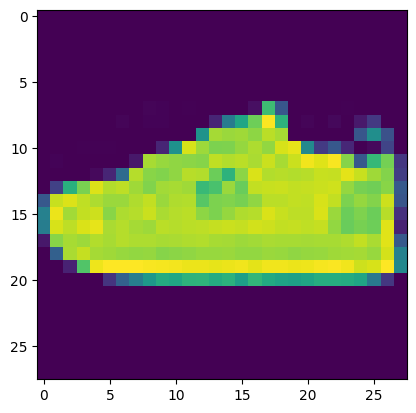

In [28]:
plt.imshow(np.reshape(X_train_list[59999],(28,28,1)))

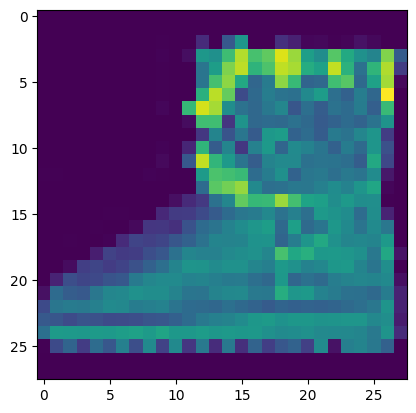

In [29]:
plt.imshow(np.reshape(X_train_list[12],(28,28,1)))

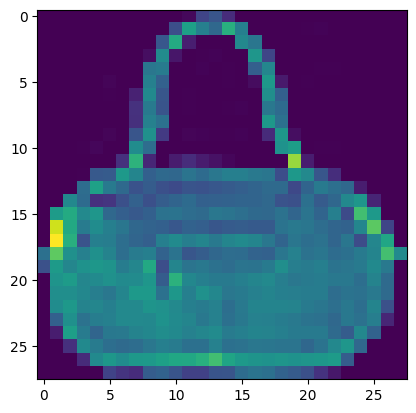

In [30]:
plt.imshow(np.reshape(X_train_list[20],(28,28,1)))

In [31]:
from sklearn.linear_model import LogisticRegression
logreg=LogisticRegression(random_state=12).fit(X_train,y_train)

c:\ANACONDA\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [32]:
logreg.score(X_train,y_train)

0.8620833333333333

In [33]:
logreg.score(X_test,y_test)

0.8544

In [34]:
logreg.predict([X_train_list[3]])

c:\ANACONDA\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


array([0], dtype=int64)

Precision,Recall and f1 score... 

In [35]:
y_pred = logreg.predict(X_test)

In [36]:
from sklearn import metrics
cm = metrics.confusion_matrix(y_test,y_pred)
cm

array([[817,  11,  18,  31,   7,   0,  96,   0,  19,   1],
       [  1, 976,   4,  13,   0,   2,   4,   0,   0,   0],
       [ 14,   2, 762,  13, 122,   0,  75,   0,  12,   0],
       [ 30,  28,  16, 871,  29,   0,  23,   0,   3,   0],
       [  1,   2,  72,  34, 822,   1,  65,   0,   3,   0],
       [  2,   2,   0,   0,   0, 883,   1,  64,  10,  38],
       [147,   7, 106,  31, 109,   0, 584,   0,  16,   0],
       [  0,   0,   0,   0,   0,  27,   0, 932,   1,  40],
       [  2,   2,   9,   2,   5,   7,  17,   4, 950,   2],
       [  0,   0,   0,   0,   0,  14,   0,  36,   3, 947]], dtype=int64)

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

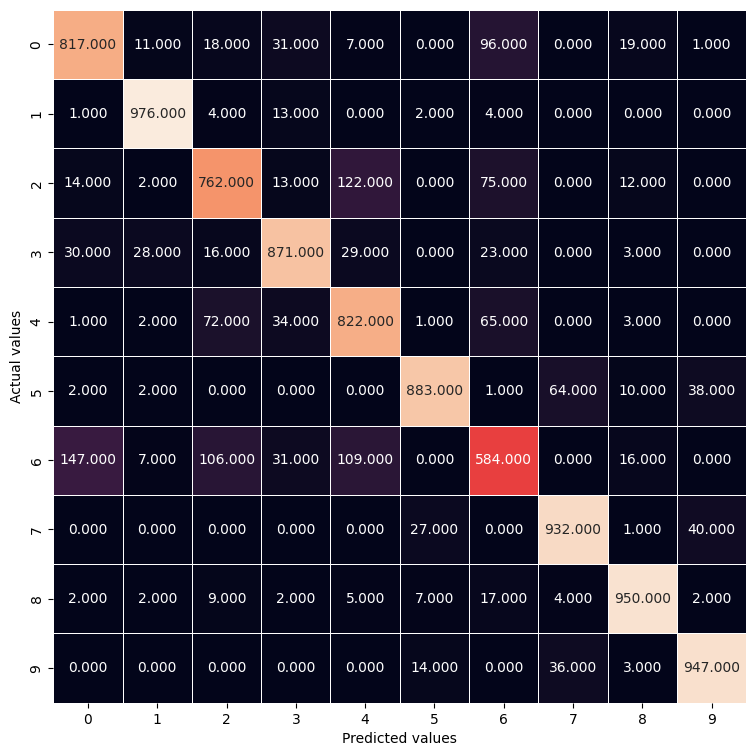

In [38]:
plt.figure(figsize=(9,9))
sns.heatmap(cm,annot=True,fmt='0.3f',linewidth=0.5,
            square=True, cbar=False)
plt.ylabel('Actual values')
plt.xlabel('Predicted values')
plt.show()

In [39]:
print(metrics.classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.81      0.82      0.81      1000
           1       0.95      0.98      0.96      1000
           2       0.77      0.76      0.77      1000
           3       0.88      0.87      0.87      1000
           4       0.75      0.82      0.79      1000
           5       0.95      0.88      0.91      1000
           6       0.68      0.58      0.63      1000
           7       0.90      0.93      0.92      1000
           8       0.93      0.95      0.94      1000
           9       0.92      0.95      0.93      1000

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000

